# Fruit 360 Dataset

## 1.1 Description

<!DOCTYPE html>
<html>
    <head><b>Fruits 360 dataset: A dataset of images containing fruits and vegetables
        Version: 2019.07.07.0</b><head><br>
        <br>
    <head><b> Content </b><head>
            <body><p>The following fruits and are included: Apples (different varieties: Crimson Snow, Golden, Golden-Red, Granny Smith, Pink Lady, Red, Red Delicious), Apricot, Avocado, Avocado ripe, Banana (Yellow, Red, Lady Finger), Blueberry, Cactus fruit, Cantaloupe (2 varieties), Carambula, Cherry (different varieties, Rainier), Cherry Wax (Yellow, Red, Black), Chestnut, Clementine, Cocos, Dates, Ginger Root, Granadilla, Grape (Blue, Pink, White (different varieties)), Grapefruit (Pink, White), Guava, Hazelnut, Huckleberry, Kiwi, Kaki, Kohlrabi, Kumsquats, Lemon (normal, Meyer), Lime, Lychee, Mandarine, Mango (Green, Red), Mangostan, Maracuja, Melon Piel de Sapo, Mulberry, Nectarine (Regular, Flat), Onion (Red, White), Orange, Papaya, Passion fruit, Peach (different varieties), Pepino, Pear (different varieties, Abate, Kaiser, Monster, Red, Williams), Pepper (Red, Green, Yellow), Physalis (normal, with Husk), Pineapple (normal, Mini), Pitahaya Red, Plum (different varieties), Pomegranate, Pomelo Sweetie, Potato (Red, White), Quince, Rambutan, Raspberry, Redcurrant, Salak, Strawberry (normal, Wedge), Tamarillo, Tangelo, Tomato (different varieties, Maroon, Cherry Red, Yellow), Walnut.</p></body>
    <br>
    <head><b> Datset Properties</b></head>
        <body><p>otal number of images: 77917.

Training set size: 58266 images (one fruit or vegetable per image).

Test set size: 19548 images (one fruit or vegetable per image).

Multi-fruits set size: 103 images (more than one fruit (or fruit class) per image)

Number of classes: 114 (fruits and vegetables).

Image size: 100x100 pixels.

Filename format: image_index_100.jpg (e.g. 32_100.jpg) or r_image_index_100.jpg (e.g. r_32_100.jpg) or r2_image_index_100.jpg or r3_image_index_100.jpg. "r" stands for rotated fruit. "r2" means that the fruit was rotated around the 3rd axis. "100" comes from image size (100x100 pixels).

Different varieties of the same fruit (apple for instance) are stored as belonging to different classes.</p></body>
<br>
<br>
   <head><b> How we made it</b></head>
   <body><p>Fruits and vegetables were planted in the shaft of a low speed motor (3 rpm) and a short movie of 20 seconds was recorded.

A Logitech C920 camera was used for filming the fruits. This is one of the best webcams available.

Behind the fruits, we placed a white sheet of paper as background.

However, due to the variations in the lighting conditions, the background was not uniform and we wrote a dedicated algorithm which extracts the fruit from the background. This algorithm is of flood fill type: we start from each edge of the image and we mark all pixels there, then we mark all pixels found in the neighborhood of the already marked pixels for which the distance between colors is less than a prescribed value. We repeat the previous step until no more pixels can be marked.

All marked pixels are considered as being background (which is then filled with white) and the rest of the pixels are considered as belonging to the object.

The maximum value for the distance between 2 neighbor pixels is a parameter of the algorithm and is set (by trial and error) for each movie.

Pictures from the test-multiple_fruits folder were taken with a Nexus 5X phone.</p></body>

## 1.2 Sources/Useful links

1.  https://www.kaggle.com/moltean/fruits <br>

## 1.3 Real World/Business Objective Constraint

* Low Latency Application<br>
* Feature importance not to be consider<br>
* Errors can be quite costly


## 2.0 Machine learning problem formulation

## 2.1 Data

### 2.1.1 Data Overview

<head><b> Datset Properties</b></head>
        <body><p>Total number of images: 77917.

* Training set size: 58266 images (one fruit or vegetable per image).

* Test set size: 19548 images (one fruit or vegetable per image).

* Multi-fruits set size: 103 images (more than one fruit (or fruit class) per image)

* Number of classes: 114 (fruits and vegetables).

* Image size: 100x100 pixels.

* Filename format: image_index_100.jpg (e.g. 32_100.jpg) or r_image_index_100.jpg (e.g. r_32_100.jpg) or r2_image_index_100.jpg or r3_image_index_100.jpg. "r" stands for rotated fruit. "r2" means that the fruit was rotated around the 3rd axis. "100" comes from image size (100x100 pixels).

* Different varieties of the same fruit (apple for instance) are stored as belonging to different classes.</p></body>

### 2.1.2 Example Data Point

<p> Apple</p>
<img src='Training/Apple Golden 2/0_100.jpg'><br>
<p> Apple </p>
<img src='Training/Apple Golden 1/10_100.jpg'><br>
<p>Banana</p>
<img src='Training/Banana/0_100.jpg'><br>
<p> Blueberry </p>
<img src='Training/Blueberry/0_100.jpg'><br>


## 2.2 Mapping the real world problem to the Machine Learning problem

### 2.2.1

### Type of Machine Learning problem

<p>
    
    There are 114 types of Fruits and Vegetables which can be Classified -  Multiclass Classification Problem

</p>

### 2.2.2 Performance Metrics

Metric(s):<br>
* Multiclass Logloss
* Conusion Marix 

## 3. Exploratory Data Analysis

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import os,os.path
from PIL import Image
from sklearn.linear_model import SGDClassifier
from dask_ml.wrappers import Incremental

## 3.1 Reading and Preprocessing  Data

### 3.1.1 Reading and Preprocessing Training Data

In [2]:
path = "Training"
labels = os.listdir(path)
path_lst = []
for i in range(len(labels)):
    st = "Training/"+ labels[i]
    path_lst.append(st)
dic = {}
for i in labels:
    dic[i]=[]
valid_images = [".jpg"]
for track in path_lst:
    path = track
    listing = os.listdir(track)
    for i in range(0,len(listing),20):
        for f in listing[i:i+20]:
            ext = os.path.splitext(f)[1]
            if ext.lower() not in valid_images:
                continue
            m =os.path.join(path,f)
            m = Image.open(m)
            n= np.array(m)
            n= n.reshape(30000)
            dic[path[9:]].append(n)
            m.close()

    

In [3]:
New_labels= []
for i in range(len(labels)):
    New_labels.append((i,labels[i]))
Train_data =[]
Train_labels = []
i=0
for k in dic:
    strlen = len(dic[New_labels[i][1]])
    for j in range(strlen):
        Train_labels.append(i)
    i=i+1
m = 0
for z in dic:
    ld = dic[New_labels[m][1]]
    ln = len(dic[New_labels[m][1]])
    for i in range(ln):
        dat = ld[i]
        Train_data.append(dat)
    m+=1
        
    

In [4]:
print(len(Train_data))
print(len(Train_labels))

57276
57276


### 3.1.2 Reading and Preprocessing Test Data

In [5]:
path = "Test"
test_labels = os.listdir(path)
test_path_lst = []
for i in range(len(test_labels)):
    st = "Test/"+ test_labels[i]
    test_path_lst.append(st)
test_dic = {}
for i in test_labels:
    test_dic[i]=[]
valid_images = [".jpg"]
for track in test_path_lst:
    path = track
    listing = os.listdir(track)
    for i in range(0,len(listing),20):
        for f in listing[i:i+20]:
            ext = os.path.splitext(f)[1]
            if ext.lower() not in valid_images:
                continue
            m =os.path.join(path,f)
            m = Image.open(m)
            n= np.array(m)
            n= n.reshape(30000)
            test_dic[path[5:]].append(n)
            m.close()

    

In [6]:
test_New_labels= []
for i in range(len(test_labels)):
    test_New_labels.append((i,test_labels[i]))
Test_data =[]
Test_labels = []
i=0
for k in test_dic:
    strlen = len(test_dic[test_New_labels[i][1]])
    for j in range(strlen):
        Test_labels.append(i)
    i=i+1
m = 0
for z in test_dic:
    ld = test_dic[test_New_labels[m][1]]
    ln = len(test_dic[test_New_labels[m][1]])
    for i in range(ln):
        dat = ld[i]
        Test_data.append(dat)
    m+=1
        
    

In [7]:
print(len(Test_labels))
print(len(Test_data))

19548
19548


### 3.1.3 Train , CV Split

In [8]:
Train_Data, CV_Data, y_train, y_cv = train_test_split(Train_data, Train_labels, stratify=Train_labels, test_size=0.1)
print('Number of data points in train data:', len(Train_Data))
print('Number of data points in test data:', len(Test_data))
print('Number of data points in cross validation data:', len(CV_Data))

Number of data points in train data: 51548
Number of data points in test data: 19548
Number of data points in cross validation data: 5728


### 3.1.4 Distribution of y_i's in Train, Test and Cross Validation datasets

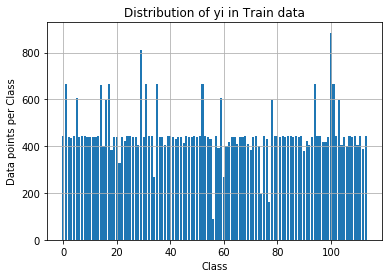

--------------------------------------------------------------------------------


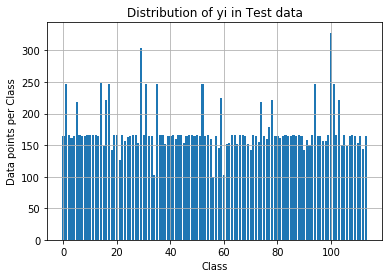

--------------------------------------------------------------------------------


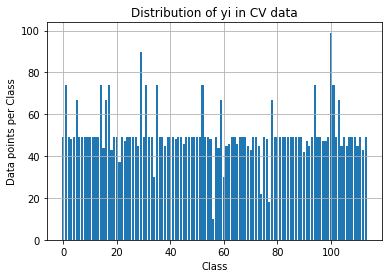

--------------------------------------------------------------------------------


In [9]:
train_class_distribution={}
cv_class_distribution = {}
test_class_distribution = {}
for i in range(114):
    train_class_distribution[i] = y_train.count(i)
for i in range(114):
    cv_class_distribution[i] = y_cv.count(i)
for i in range(114):
    test_class_distribution[i] = Test_labels.count(i)
    
index = np.arange(114)
length = []
for i in range(114):
    length.append(train_class_distribution[i])

my_colors = 'rgbkymc'
plt.bar(index , length)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in Train data')
plt.grid()
plt.show()

print('-'*80)

length = []
for i in range(114):
    length.append(test_class_distribution[i])

my_colors = 'rgbkymc'
plt.bar(index , length)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in Test data')
plt.grid()
plt.show()

print('-'*80)

length = []
for i in range(114):
    length.append(cv_class_distribution[i])

my_colors = 'rgbkymc'
plt.bar(index , length)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in CV data')
plt.grid()
plt.show()

print('-'*80)



<b>Observation</b><br>   
Here we can see that Train , Test and CV have same distribution with
all the classes almost balanced

## 3.3 Predicting Through a random model

In [10]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    
    labels = [i for i in range(114)]
    # representing C in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=(30,30))
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    # representing B in heatmap format
    print("-"*20, "Precision matrix (Columm Sum=1)", "-"*20)
    plt.figure(figsize=(30,30))
    sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    
    # representing A in heatmap format
    print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
    plt.figure(figsize=(30,30))
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

Log loss on Cross Validation Data using Random Model 5.032364754993844
Log loss on Test Data using Random Model 5.041067377817109
-------------------- Confusion matrix --------------------


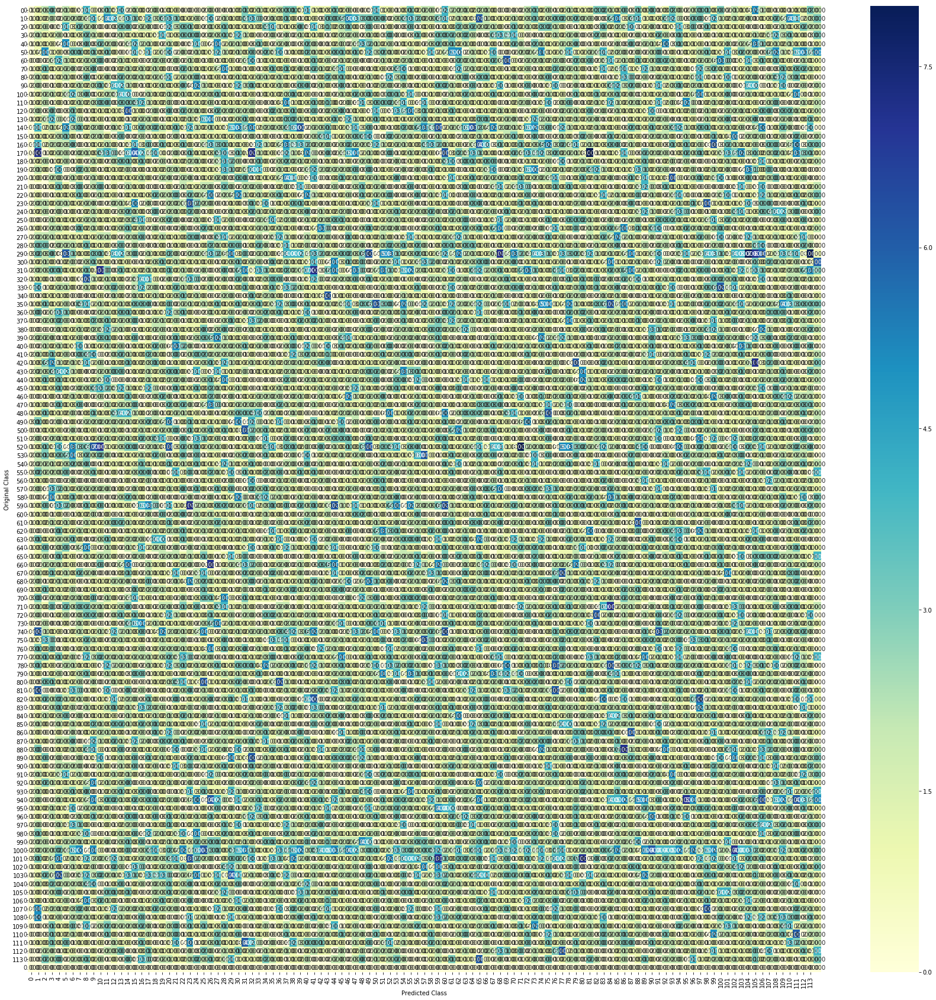

-------------------- Precision matrix (Columm Sum=1) --------------------


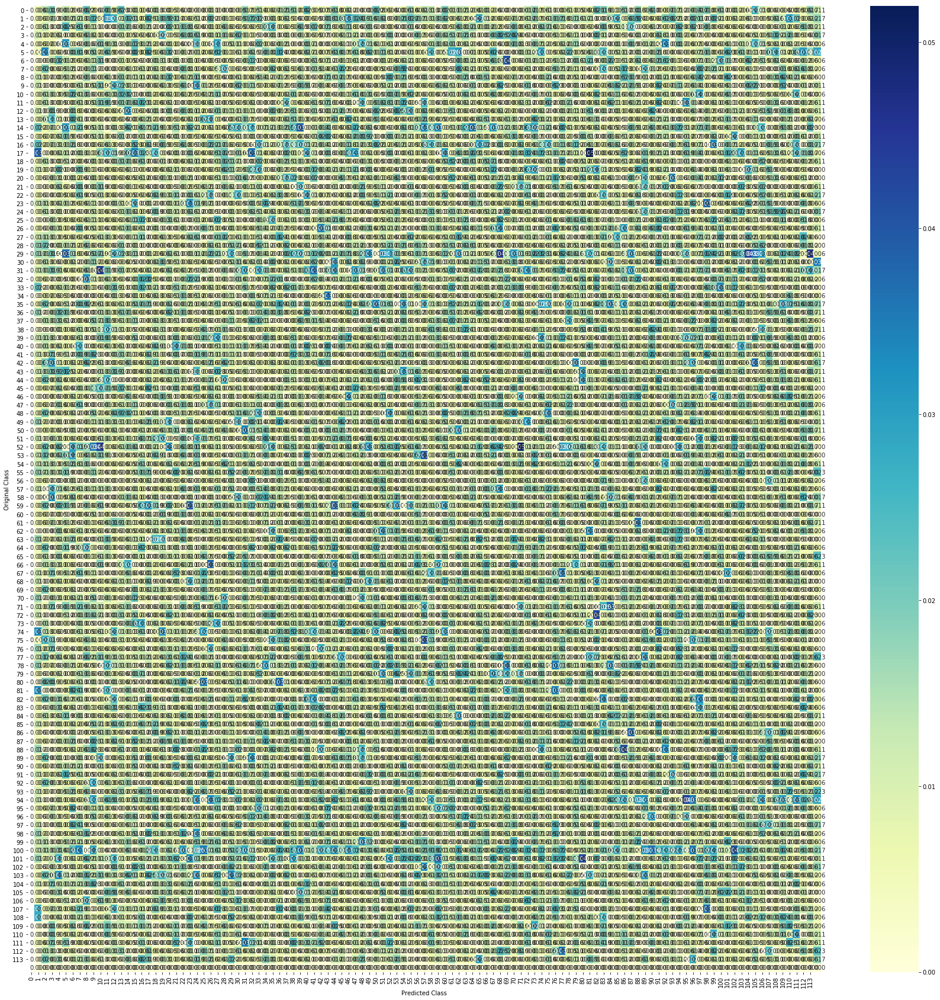

-------------------- Recall matrix (Row sum=1) --------------------


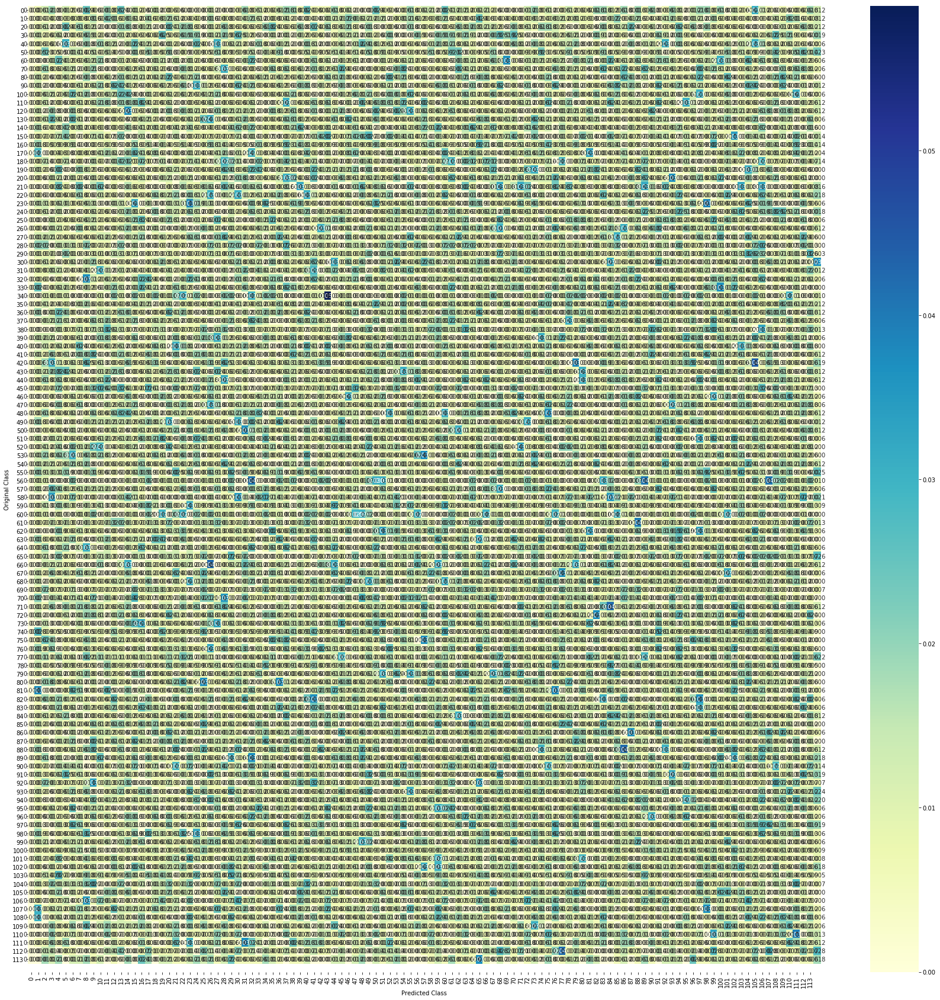

In [11]:
# we need to generate 114 numbers and the sum of numbers should be 1
# one solution is to genarate 114 numbers and divide each of the numbers by their sum
import random as ran
test_data_len = len(Test_labels)
cv_data_len = len(y_cv)

cv_predicted_y = []
for i in range(cv_data_len):
    r = [ran.random() for i in range(1,115)]
    s = sum(r)
    r = [ i/s for i in r ]
    cv_predicted_y.append(r)
print("Log loss on Cross Validation Data using Random Model",log_loss(y_cv,cv_predicted_y, eps=1e-15))


# Test-Set error.
test_predicted_y = []
for i in range(test_data_len):
    r = [ran.random() for i in range(1,115)]
    s = sum(r)
    r = [ i/s for i in r ]
    test_predicted_y.append(r)
print("Log loss on Test Data using Random Model",log_loss(Test_labels,test_predicted_y, eps=1e-15))

predicted_y =np.argmax(test_predicted_y, axis=1)
plot_confusion_matrix(Test_labels, predicted_y+1)

<b>Observation</b> <br>
From above we can see that Log loss on Cross Validation Data using Random Model 5.031532203494308 and Log loss on Test Data using Random Model 5.0436049349621355
so our model must have Log loss less than 5 .

## 4.  Applying Logistic Regression 

### Logistic Regression with l2 regularization

In [42]:
alpha = [10**i for i in range(-4,4) ]
cv_log_error_array = []
Train_log_error_array = []
lbls = [i for i in range(114)]
for i in alpha:
    print("for alpha =", i)
    clf2 = SGDClassifier(alpha = i,penalty='l2',loss='log') 
    n_iter = 5
    for n in range(n_iter):
        for i in range(0, len(Train_Data), 2000):
            dat = np.asarray(Train_Data[i:i+2000])
            clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
    sig_clf_probs = clf2.predict_proba(np.asarray(CV_Data))
    sig_clf_probs=np.nan_to_num(sig_clf_probs)
    cv_log_error_array.append(log_loss(y_cv, sig_clf_probs, labels=list(index), eps=1e-15))
    predict_y=[]
    for i in range(0,len(y_train),2000):
        p = clf2.predict_proba(Train_Data[i:i+2000])
        p = np.nan_to_num(p)
        predict_y.extend(p)
    Train_log_error_array.append(log_loss(y_train,predict_y))
    print("Log Loss :",log_loss(y_cv, sig_clf_probs)) 
    print("Accuracy :",clf2.score(CV_Data,y_cv))

for alpha = 0.0001
Log Loss : 0.567439274427627
Accuracy : 0.9633379888268156
for alpha = 0.001
Log Loss : 0.725954016346483
Accuracy : 0.9495460893854749
for alpha = 0.01
Log Loss : 0.5738252144406923
Accuracy : 0.9636871508379888
for alpha = 0.1
Log Loss : 0.7395514132764188
Accuracy : 0.9455307262569832
for alpha = 1
Log Loss : 0.5907990046807491
Accuracy : 0.9514664804469274
for alpha = 10
Log Loss : 1.0413778691856912
Accuracy : 0.9167248603351955
for alpha = 100
Log Loss : 0.33648907967904906
Accuracy : 0.9472765363128491
for alpha = 1000
Log Loss : 0.3177831756000262
Accuracy : 0.9718924581005587


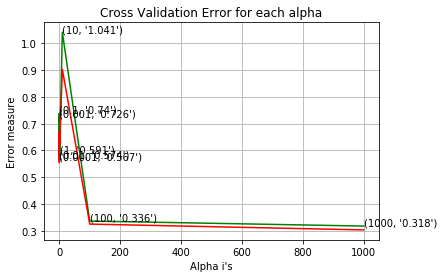

In [43]:
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
ax.plot(alpha,Train_log_error_array,c='r')
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


The log_loss for the Test data is : 2.5268970508361503
The accuracy for the Test data is : 0.8427460609781052
-------------------- Confusion matrix --------------------


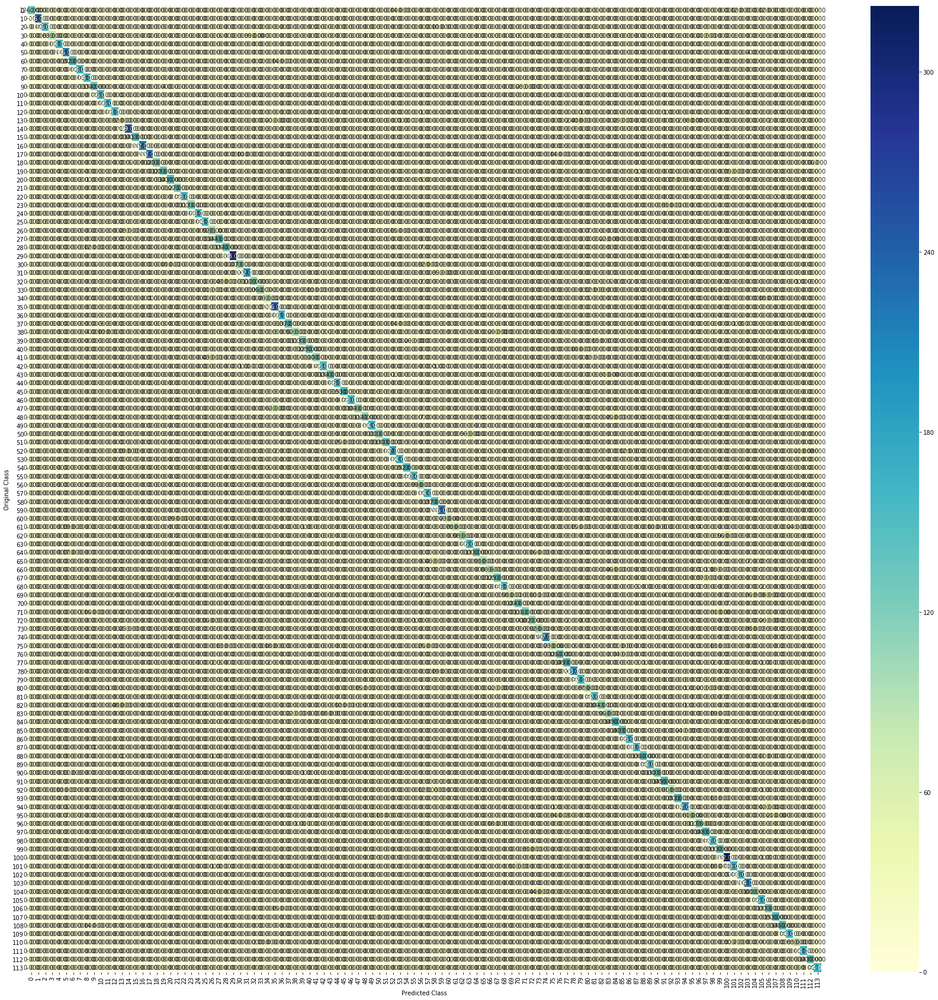

-------------------- Precision matrix (Columm Sum=1) --------------------


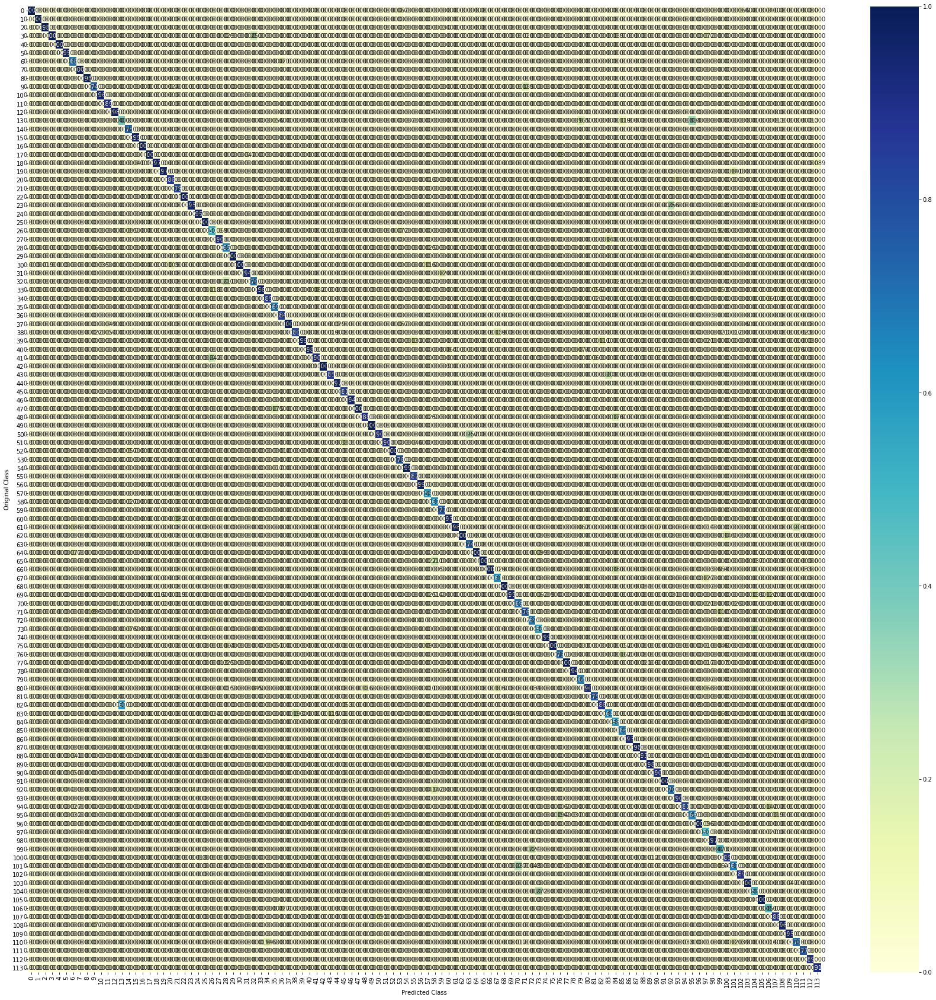

-------------------- Recall matrix (Row sum=1) --------------------


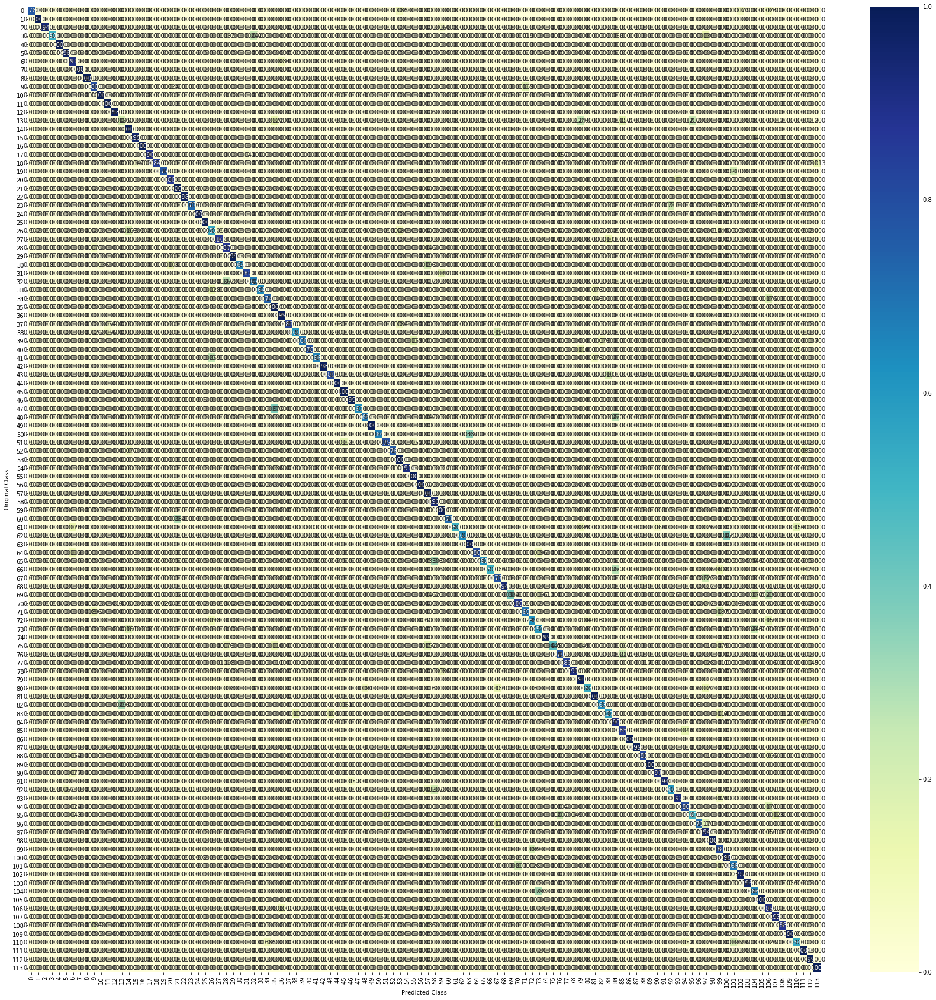

In [46]:
best_alpha = 0.0001
clf2 = SGDClassifier(alpha = best_alpha, penalty='l2', loss='log', random_state=42)
n_iter = 10
for n in range(n_iter):
    for i in range(0, len(Train_Data), 2000):
        dat = np.asarray(Train_Data[i:i+2000])
        clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
predict_y=[]
acc = []
for i in range(0,len(Test_labels),2000):
    p = clf2.predict_proba(Test_data[i:i+2000])
    p_ = clf2.predict(Test_data[i:i+2000])
    p = np.nan_to_num(p)
    predict_y.extend(p)
    acc.extend(p_)
print("The log_loss for the Test data is :",log_loss(Test_labels,predict_y))
print("The accuracy for the Test data is :",accuracy_score(Test_labels,acc))
plot_confusion_matrix(Test_labels,acc)

The log_loss for the Test data is : 0.7980332423601868
The accuracy for the Test data is : 0.8685799058727236
-------------------- Confusion matrix --------------------


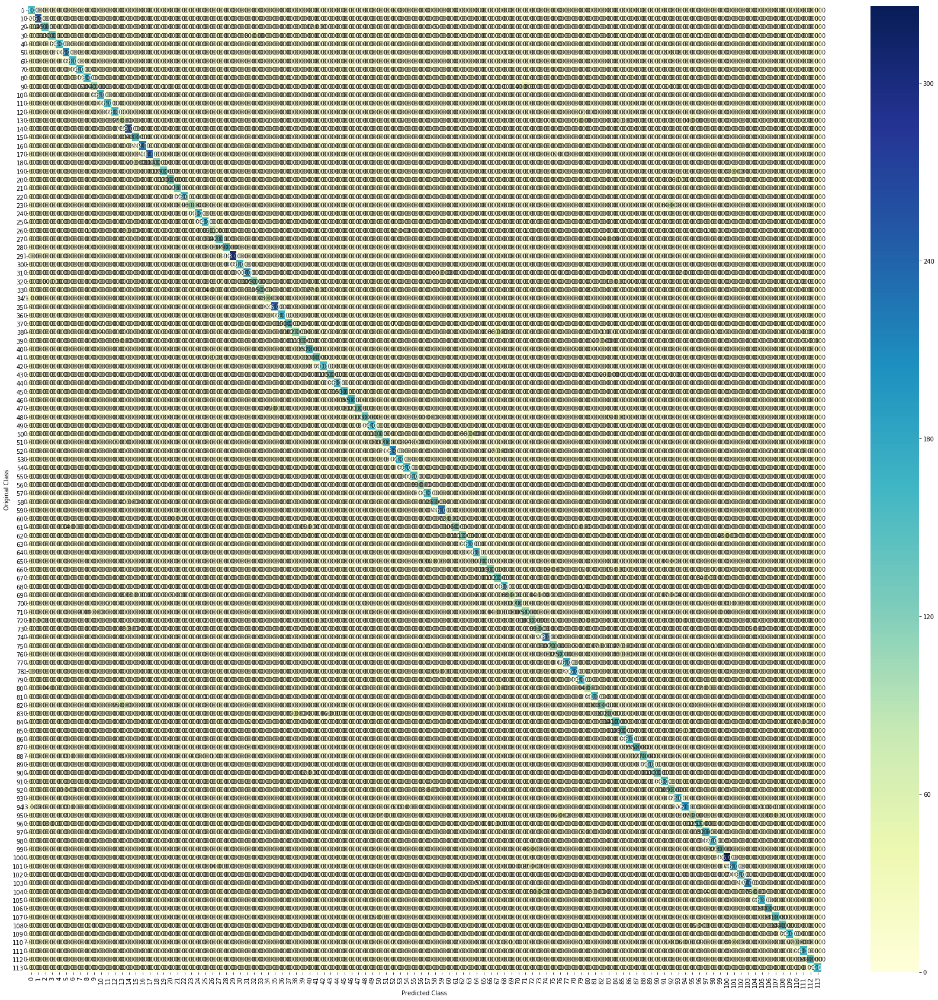

-------------------- Precision matrix (Columm Sum=1) --------------------


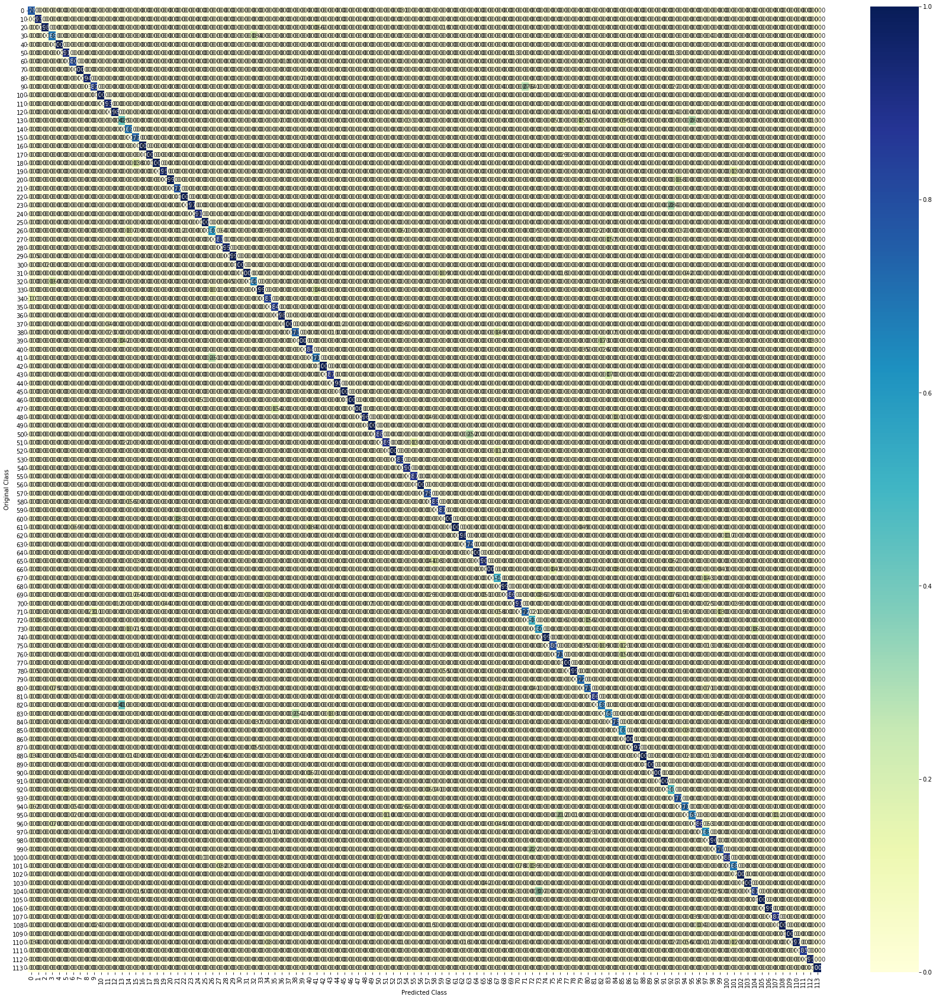

-------------------- Recall matrix (Row sum=1) --------------------


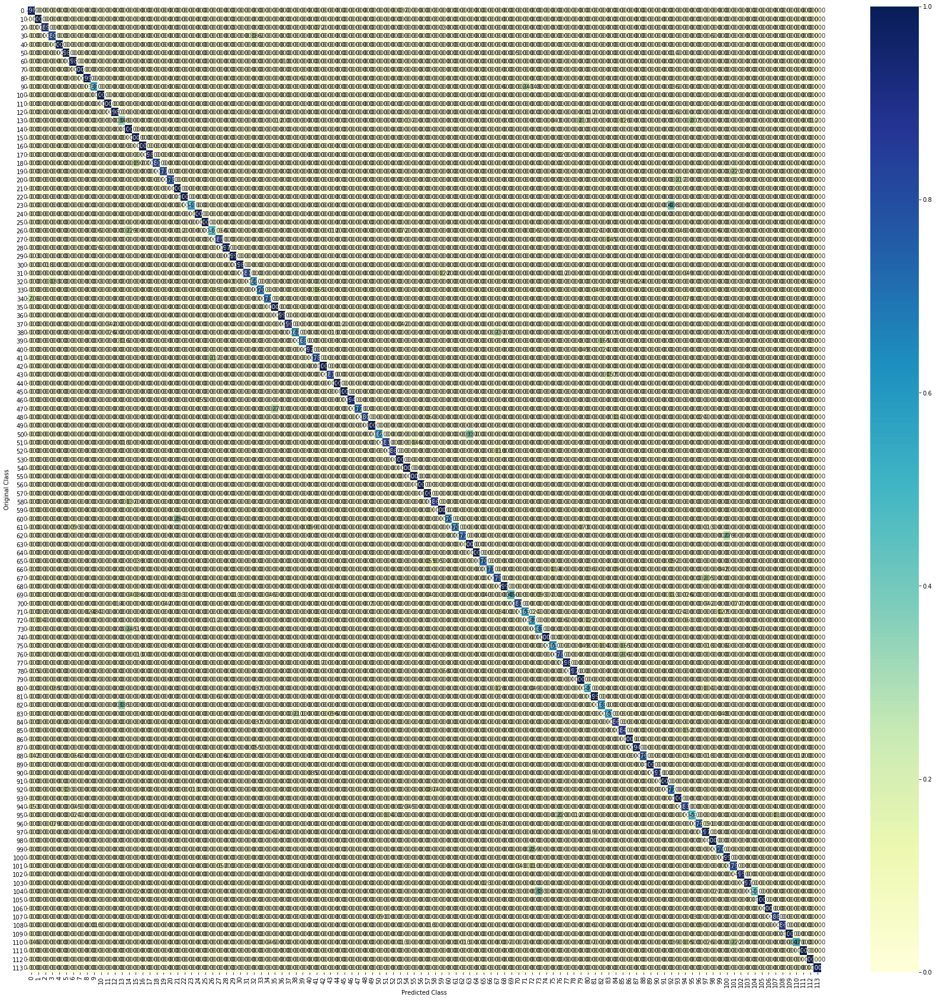

In [47]:
best_alpha = 100
clf2 = SGDClassifier(alpha = best_alpha, penalty='l2', loss='log', random_state=42)
n_iter = 10
for n in range(n_iter):
    for i in range(0, len(Train_Data), 2000):
        dat = np.asarray(Train_Data[i:i+2000])
        clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
predict_y=[]
acc = []
for i in range(0,len(Test_labels),2000):
    p = clf2.predict_proba(Test_data[i:i+2000])
    p_ = clf2.predict(Test_data[i:i+2000])
    p = np.nan_to_num(p)
    predict_y.extend(p)
    acc.extend(p_)
print("The log_loss for the Test data is :",log_loss(Test_labels,predict_y))
print("The accuracy for the Test data is :",accuracy_score(Test_labels,acc))
plot_confusion_matrix(Test_labels,acc)

### Sample Test Data Points

Actual Label of the point :  Lemon
Predicted Label of the point is :  Lemon


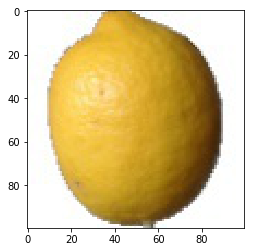

********************************************************************************
Actual Label of the point :  Grapefruit White
Predicted Label of the point is :  Grapefruit White


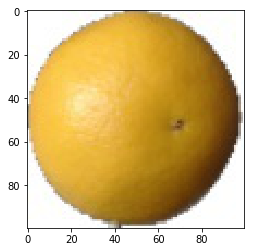

********************************************************************************
Actual Label of the point :  Pomelo Sweetie
Predicted Label of the point is :  Pomelo Sweetie


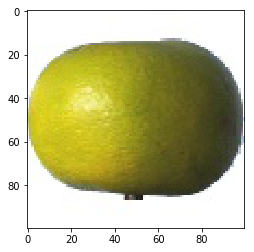

In [57]:
plt.imshow(Test_data[10000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[10000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[10000]][1])
plt.show()
print("*"*80)
plt.imshow(Test_data[15000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[15000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[15000]][1])
plt.show()
print("*"*80)
plt.imshow(Test_data[5000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[5000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[5000]][1])
plt.show()

The log_loss for the Test data is : 0.7907884760337787
The accuracy for the Test data is : 0.8432064661346429
-------------------- Confusion matrix --------------------


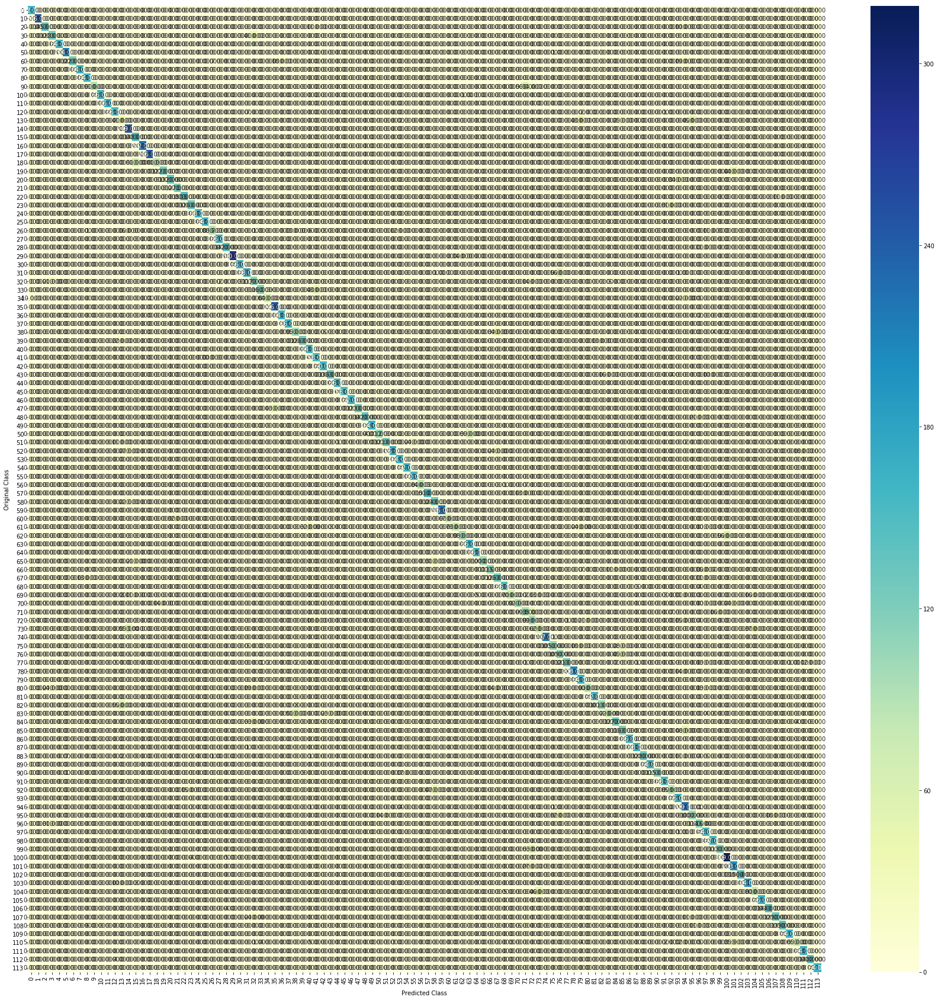

-------------------- Precision matrix (Columm Sum=1) --------------------


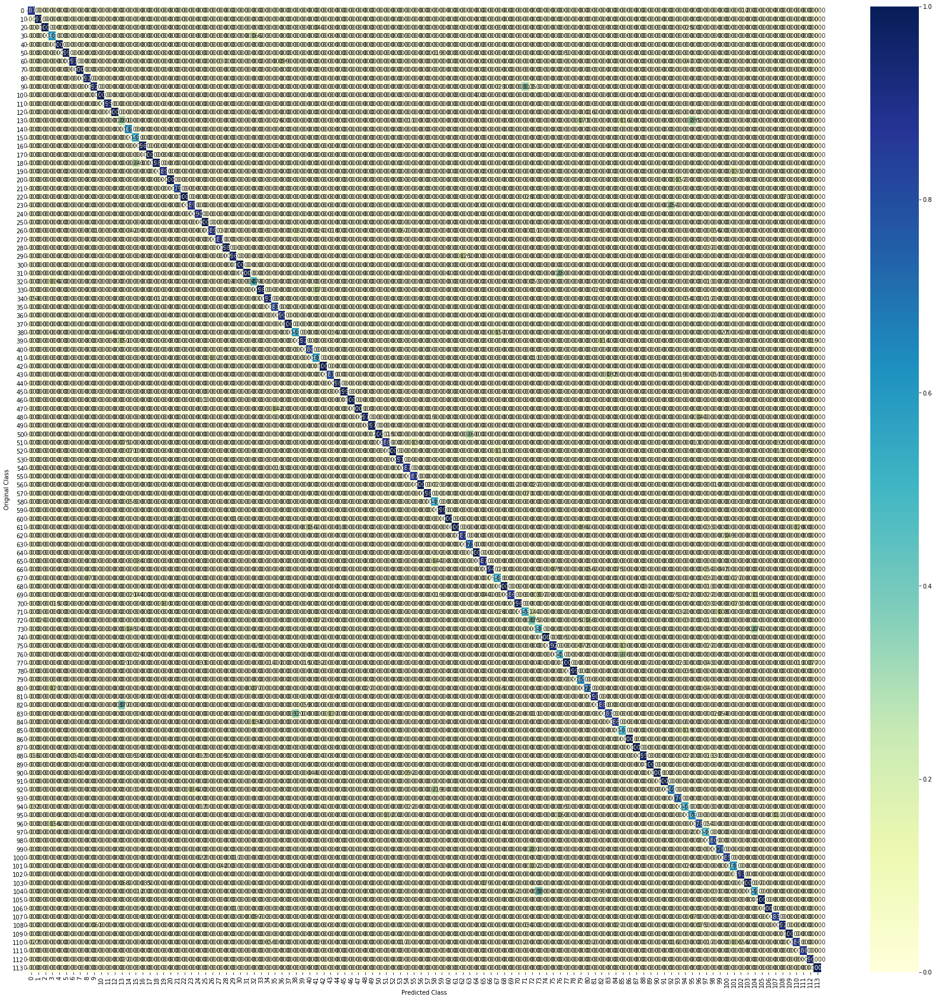

-------------------- Recall matrix (Row sum=1) --------------------


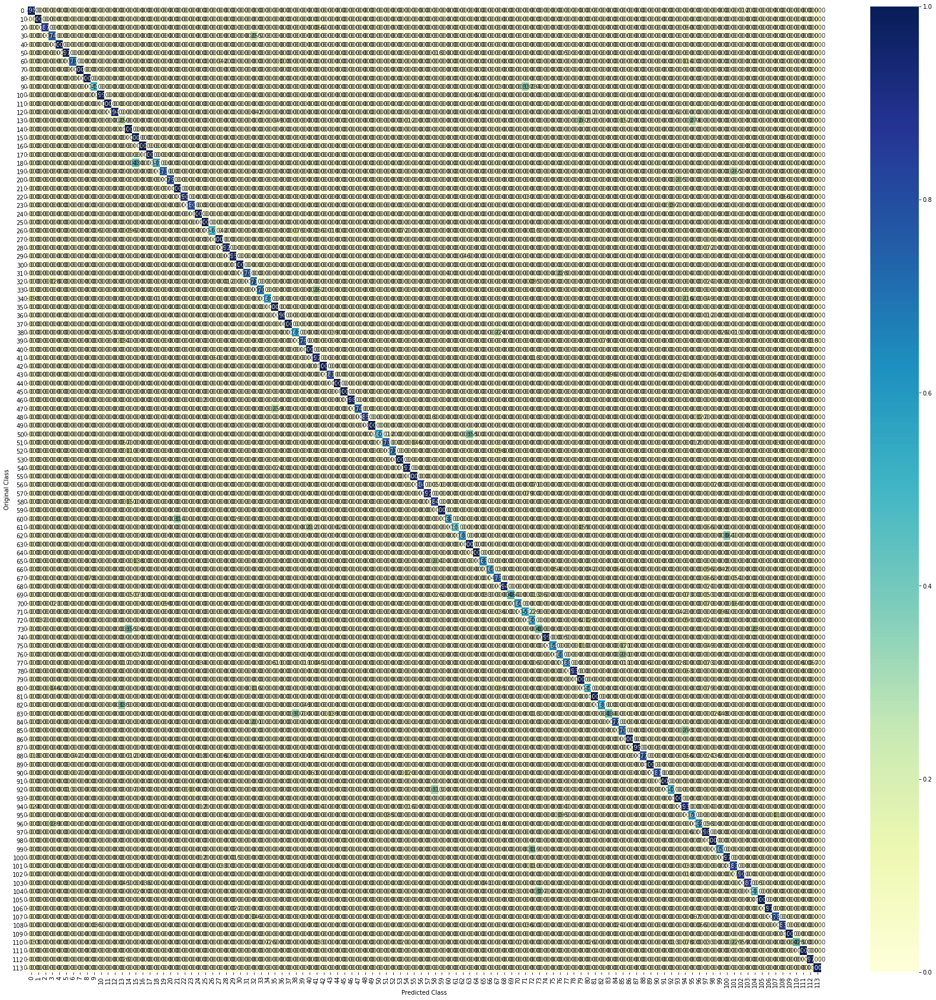

In [140]:
best_alpha = 1000
clf2 = SGDClassifier(alpha = best_alpha, penalty='l2', loss='log', random_state=42)
n_iter = 10
for n in range(n_iter):
    for i in range(0, len(Train_Data), 2000):
        dat = np.asarray(Train_Data[i:i+2000])
        clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
predict_y=[]
acc = []
for i in range(0,len(Test_labels),2000):
    p = clf2.predict_proba(Test_data[i:i+2000])
    p_ = clf2.predict(Test_data[i:i+2000])
    p = np.nan_to_num(p)
    predict_y.extend(p)
    acc.extend(p_)
print("The log_loss for the Test data is :",log_loss(Test_labels,predict_y))
print("The accuracy for the Test data is :",accuracy_score(Test_labels,acc))
plot_confusion_matrix(Test_labels,acc)

### Sample Data Points

### Logistic Regression with L1 regularization

In [60]:
alpha = [10**i for i in range(-4,4) ]
cv_log_error_array = []
Train_log_error_array = []
lbls = [i for i in range(114)]
for i in alpha:
    print("for alpha =", i)
    clf2 = SGDClassifier(alpha = i,penalty='l1',loss='log') 
    n_iter = 10
    for n in range(n_iter):
        for i in range(0, len(Train_Data), 2000):
            dat = np.asarray(Train_Data[i:i+2000])
            clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
    sig_clf_probs = clf2.predict_proba(np.asarray(CV_Data))
    sig_clf_probs=np.nan_to_num(sig_clf_probs)
    cv_log_error_array.append(log_loss(y_cv, sig_clf_probs, labels=list(index), eps=1e-15))
    predict_y=[]
    for i in range(0,len(y_train),2000):
        p = clf2.predict_proba(Train_Data[i:i+2000])
        p = np.nan_to_num(p)
        predict_y.extend(p)
    Train_log_error_array.append(log_loss(y_train,predict_y))
    print("Log Loss :",log_loss(y_cv, sig_clf_probs)) 
    print("Accuracy :",clf2.score(CV_Data,y_cv))

for alpha = 0.0001
Log Loss : 0.5850646167852662
Accuracy : 0.9710195530726257
for alpha = 0.001
Log Loss : 1.2176251072137805
Accuracy : 0.9162011173184358
for alpha = 0.01
Log Loss : 2.9878830643899574
Accuracy : 0.7634427374301676
for alpha = 0.1
Log Loss : 9.877574428701477
Accuracy : 0.22241620111731844
for alpha = 1
Log Loss : 5.121217786390691
Accuracy : 0.0033170391061452514
for alpha = 10
Log Loss : 5.492523795181822
Accuracy : 0.005237430167597765
for alpha = 100
Log Loss : 4.736244088545564
Accuracy : 0.008554469273743016
for alpha = 1000
Log Loss : 4.736397324089055
Accuracy : 0.008554469273743016


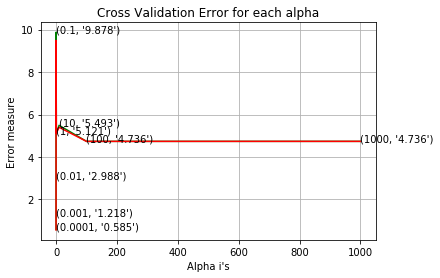

In [61]:
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
ax.plot(alpha,Train_log_error_array,c='r')
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


The log_loss for the Test data is : 3.8204413962679755
The accuracy for the Test data is : 0.7885717208921629
-------------------- Confusion matrix --------------------


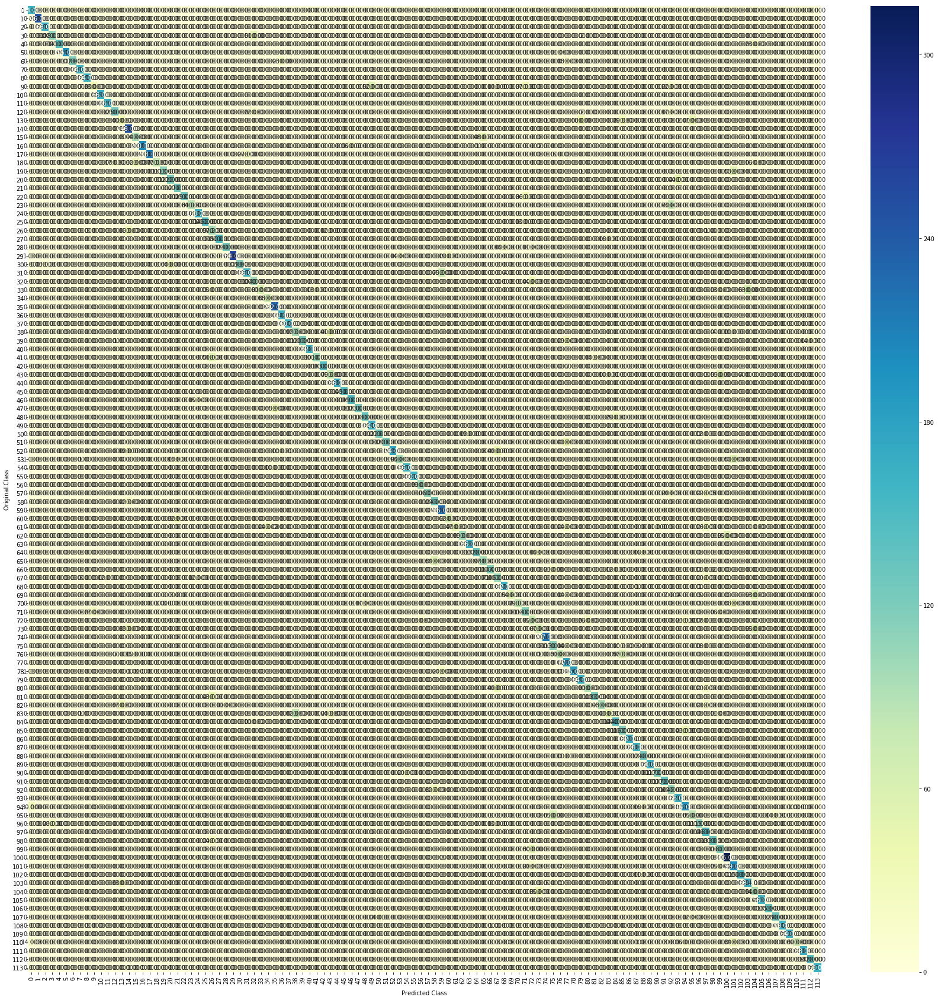

-------------------- Precision matrix (Columm Sum=1) --------------------


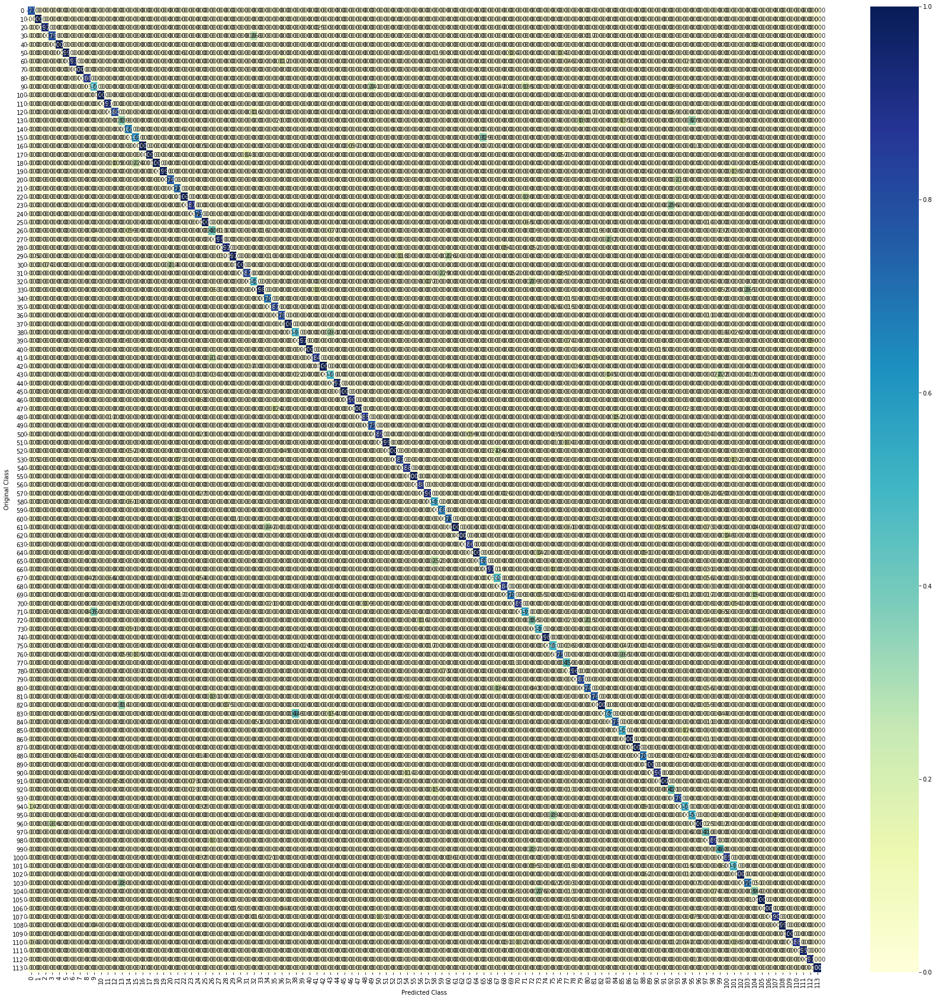

-------------------- Recall matrix (Row sum=1) --------------------


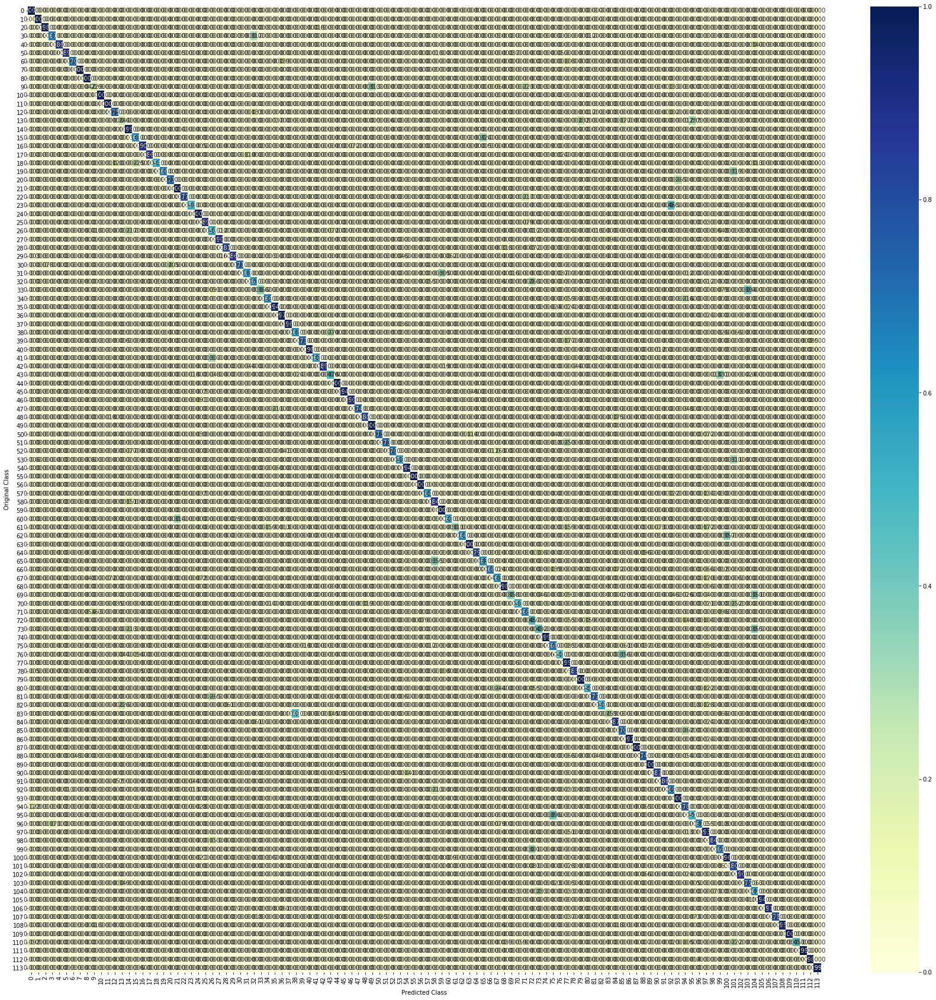

In [62]:
best_alpha = .0001
clf2 = SGDClassifier(alpha = best_alpha, penalty='l1', loss='log', random_state=42)
n_iter = 10
for n in range(n_iter):
    for i in range(0, len(Train_Data), 2000):
        dat = np.asarray(Train_Data[i:i+2000])
        clf2.partial_fit(dat,y_train[i:i+2000],classes=list(index))
predict_y=[]
acc = []
for i in range(0,len(Test_labels),2000):
    p = clf2.predict_proba(Test_data[i:i+2000])
    p_ = clf2.predict(Test_data[i:i+2000])
    p = np.nan_to_num(p)
    predict_y.extend(p)
    acc.extend(p_)
print("The log_loss for the Test data is :",log_loss(Test_labels,predict_y))
print("The accuracy for the Test data is :",accuracy_score(Test_labels,acc))
plot_confusion_matrix(Test_labels,acc)

### Sample Data Points

Actual Label of the point :  Pepper Yellow
Predicted Label of the point is :  Pepper Yellow


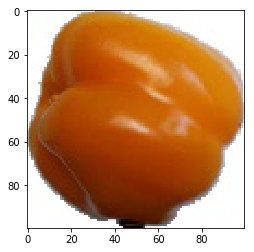

********************************************************************************
Actual Label of the point :  Strawberry
Predicted Label of the point is :  Strawberry


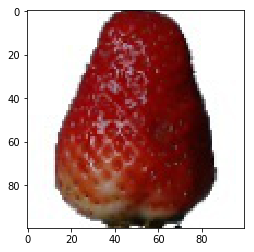

********************************************************************************
Actual Label of the point :  Apricot
Predicted Label of the point is :  Apricot


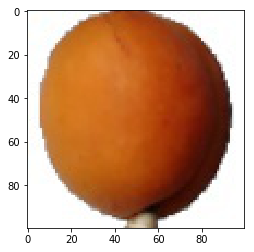

In [139]:
plt.imshow(Test_data[3000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[3000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[3000]][1])
plt.show()
print("*"*80)
plt.imshow(Test_data[6000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[6000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[6000]][1])
plt.show()
print("*"*80)
plt.imshow(Test_data[9000].reshape(100,100,3), interpolation='nearest')
print("Actual Label of the point : ", str(test_New_labels[Test_labels[9000]][1]))
print("Predicted Label of the point is : ",test_New_labels[acc[9000]][1])
plt.show()

## Conclusion

In [141]:
from prettytable import PrettyTable
print("*"*80)
print("For Logistic Regression with L2 Regularization")
print("*"*80)
x = PrettyTable()
x.field_names = ["Value of alpha","CV_loss","CV_Accuracy" ]
x.add_row([0.0001,0.567,0.963])
x.add_row([0.001,1.21,0.916])
x.add_row([0.01,0.573,0.963])
x.add_row([0.1,0.739,0.945])
x.add_row([1,0.590,0.951])
x.add_row([10,1.041,0.916])
x.add_row([100,0.336,0.947])
x.add_row([1000,0.317,0.971])
print(x)
print("*"*80)
print("Testing on some Hyperparameters")
print("*"*80)
x = PrettyTable()
x.field_names = ["Value of alpha","Test loss","Test accuracy"]
x.add_row([0.0001,2.52,0.84])
x.add_row([100,0.79,0.868])
x.add_row([1000,0.79,0.843])
print(x)
print("*"*80)
print("")
print("")
print("")
print("*"*80)
print("For Logistic Regression with L1 Regularization")
print("*"*80)
x = PrettyTable()
x.field_names = ["Value of alpha","CV_loss","CV_Accuracy" ]
x.add_row([0.0001,0.585,0.971])
x.add_row([0.001,0.725,0.949])
x.add_row([0.01,2.98,0.76])
x.add_row([0.1,9.87,0.222])
x.add_row([1,5.12,0.003])
x.add_row([10,5.49,0.005])
x.add_row([100,4.73,0.008])
x.add_row([1000,4.73,0.008])
print(x)
print("*"*80)
print("Testing on a hyperparameter")
print("Training on alpha=0.0001 , we got test loss=3.82 and test accuracy = 0.78")
print("*"*80)

********************************************************************************
For Logistic Regression with L2 Regularization
********************************************************************************
+----------------+---------+-------------+
| Value of alpha | CV_loss | CV_Accuracy |
+----------------+---------+-------------+
|     0.0001     |  0.567  |    0.963    |
|     0.001      |   1.21  |    0.916    |
|      0.01      |  0.573  |    0.963    |
|      0.1       |  0.739  |    0.945    |
|       1        |   0.59  |    0.951    |
|       10       |  1.041  |    0.916    |
|      100       |  0.336  |    0.947    |
|      1000      |  0.317  |    0.971    |
+----------------+---------+-------------+
********************************************************************************
Testing on some Hyperparameters
********************************************************************************
+----------------+-----------+---------------+
| Value of alpha | Test loss | Tes

<p><b> From above we can conclude that the best hyperparameter is 100 when performed 
    with l2 regularization and gives Test Log_loss = 0.79 and Test_accuracy = 86.8%</b></p>